<a href="https://colab.research.google.com/github/vinaytaywade/Daily_Tasks/blob/main/Zomato_reviews.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
df=pd.read_csv("/content/drive/MyDrive/zomato.csv")

In [6]:
df.isnull().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [7]:
[feature for feature in df.columns if df[feature].isnull().sum()>0]

['rate',
 'phone',
 'location',
 'rest_type',
 'dish_liked',
 'cuisines',
 'approx_cost(for two people)']

In [8]:
feature_na=[]
for feature in df.columns:
  if df[feature].isnull().sum()>0:
    feature_na.append(feature)
feature_na


['rate',
 'phone',
 'location',
 'rest_type',
 'dish_liked',
 'cuisines',
 'approx_cost(for two people)']

In [9]:
for feature in feature_na:
  print('{} has {} % misssing values'.format(feature,df[feature].isnull().sum()/len(df)*100))

rate has 15.033741322969234 % misssing values
phone has 2.335789005549432 % misssing values
location has 0.04060560357329312 % misssing values
rest_type has 0.438927238625597 % misssing values
dish_liked has 54.29162557766305 % misssing values
cuisines has 0.08701200765705668 % misssing values
approx_cost(for two people) has 0.669025658874258 % misssing values


In [10]:
data=df.copy()

In [11]:
grouped=data.groupby(['name','address']).agg({'listed_in(type)':list})

In [12]:
grouped

listed_in(type)
name                                         address                                                                                              
#FeelTheROLL                                 Opposite Mantri Commercio, Outer Ring Road, Dev...                               [Delivery, Delivery]
#L-81 Cafe                                   Sector 6, HSR Layout, HSR                           [Delivery, Dine-out, Delivery, Dine-out, Deliv...
#Vibes Restro                                Marasur Gate, Chandapura - Anekal Road, Near Al...                       [Buffet, Delivery, Dine-out]
#refuel                                      7, Ground Floor, RR Commercial Complex, Akshay ...                        [Cafes, Delivery, Dine-out]
'Brahmins' Thatte Idli                       19, 1st main, 2nd cross, 3rd stage, 3rd block, ...                                         [Dine-out]
...                                                                                                                                            ...
nu.tree                                      47/7 First floor, DoddaThogur Road, Near Velank...                                         [Delivery]
                                             Ground Floor-Lobby Area, Brigade IRV Centre, Na...                     [Delivery, Delivery, Delivery]
re:cess - Hilton Bangalore Embassy GolfLinks Hilton Bangalore Embassy GolfLinks, Embassy Gol...                [Dine-out, Dine-out, Pubs and bars]
repEAT Hub                                   67/4, Bhoganahalli Road, JCR Layout, Panathur, ...                               [Delivery, Dine-out]
sCoolMeal                                    197/293-3, 32nd Main, 1st Stage, BTM, Bangalore     [Delivery, Delivery, Delivery, Delivery, Deliv...

[12499 rows x 1 columns]

In [13]:
newdata=pd.merge(grouped,data,on=(['name','address']))

In [14]:
newdata.shape

(51717, 18)

In [15]:
newdata.drop_duplicates(subset=['name','address','listed_in(type)_y'],inplace=True)

In [16]:
newdata.shape

(20915, 18)

In [17]:
newdata=newdata.reset_index(drop=True)

In [18]:
newdata['rating']=newdata['rate'].str[:3]

In [19]:
newdata['rating'].replace('NEW',0,inplace=True)
newdata['rating'].replace('-',0,inplace=True)


In [20]:
newdata['rating']=pd.to_numeric(newdata['rating'])

In [21]:
newdata['rating']=pd.cut(newdata['rating'],bins=[1,3.25,4.1,5.0],labels=['0','1','2'])

<Axes: ylabel='count'>

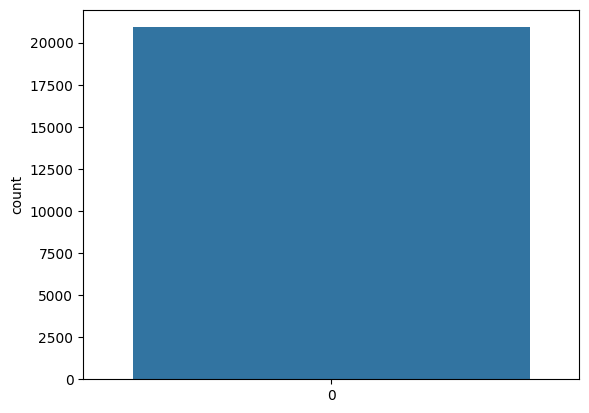

In [22]:
sns.countplot(newdata['rating'])

In [23]:
rev=newdata['reviews_list'][0].lower()


In [24]:
#converting data into lowercase
import re

In [25]:
rev2=re.sub('a-zA-Z','',rev)

In [26]:
rev3=re.sub('a-zA-Z','',rev2)
rev3

'[(\'rated 5.0\', "rated\\n  had an egg chicken roll and a paneer roll... really yummy... a must visit place... it would be good if you guys can keep the shop open on sunday\'s as well.. good luck... :-)"), (\'rated 5.0\', \'rated\\n  not just the roll but the filling tastes great. i would highly recommend to others to try their rolls. owners hospitality is also good and very friendly.\'), (\'rated 4.5\', \'rated\\n  very nice place complete value for money ? highly recommend.must visit for any foodie . i would recommend the egg chicken roll . #feeltheroll\'), (\'rated 5.0\', \'rated\\n  had an amazing mouth-watering ?chicken roll?worth every bite..a must try for every foodie?a variety of rolls and sandwiches are available as well .. a budding rafflesia ?\')]'

In [27]:
rev4=re.sub(' +','',rev3)
rev4

'[(\'rated5.0\',"rated\\nhadaneggchickenrollandapaneerroll...reallyyummy...amustvisitplace...itwouldbegoodifyouguyscankeeptheshopopenonsunday\'saswell..goodluck...:-)"),(\'rated5.0\',\'rated\\nnotjusttherollbutthefillingtastesgreat.iwouldhighlyrecommendtootherstotrytheirrolls.ownershospitalityisalsogoodandveryfriendly.\'),(\'rated4.5\',\'rated\\nveryniceplacecompletevalueformoney?highlyrecommend.mustvisitforanyfoodie.iwouldrecommendtheeggchickenroll.#feeltheroll\'),(\'rated5.0\',\'rated\\nhadanamazingmouth-watering?chickenroll?wortheverybite..amusttryforeveryfoodie?avarietyofrollsandsandwichesareavailableaswell..abuddingrafflesia?\')]'

In [28]:
sample=newdata.sample(n=2000)

In [29]:
total_review=''
for review in sample['reviews_list']:
  review=review.lower()
  review=re.sub('[^a-zA-Z]',' ',review)
  review=re.sub('rated','',review)
  review=re.sub(' +',' ',review)
  total_review=total_review + str(review)

In [30]:
total_review[0:100]

' n ordered masala dosa from here for breakfast the dosas were very small but sambar chutney and doaa'

In [31]:
import wordcloud
from wordcloud import WordCloud,STOPWORDS

In [32]:
stopwords=set(STOPWORDS)

In [33]:
wordcloud=WordCloud(stopwords=stopwords).generate(total_review)

(-0.5, 399.5, 199.5, -0.5)

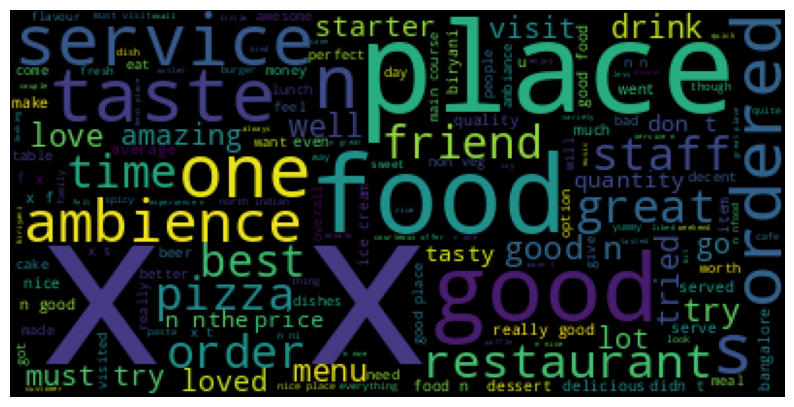

In [34]:
plt.figure(figsize=(10,8))
plt.imshow(wordcloud)
plt.axis('off')

In [35]:
def lower_data(text):
  return text.lower

In [36]:
newdata['review_list']=newdata['reviews_list'].apply(lower_data)

In [37]:
newdata['review_list']=newdata['reviews_list'].apply(lambda x:x.lower())

In [38]:

!pip install nltk

In [39]:
import nltk
from nltk.corpus import RegexpTokenizer as regextoken


In [40]:
tokenizer=regextoken('[a-zA-Z]+')

In [41]:
data=newdata['reviews_list'][0]
data

'[(\'Rated 5.0\', "RATED\\n  Had an egg chicken roll and a paneer roll... Really yummy... A must visit place... It would be good if you guys can keep the shop open on Sunday\'s as well.. Good luck... :-)"), (\'Rated 5.0\', \'RATED\\n  Not just the Roll but the filling tastes great. I would highly recommend to others to try their rolls. Owners hospitality is also good and very friendly.\'), (\'Rated 4.5\', \'RATED\\n  Very nice place complete value for money ? Highly recommend.Must visit for any foodie . I would recommend the egg chicken roll . #feeltheroll\'), (\'Rated 5.0\', \'RATED\\n  Had an amazing mouth-watering ?chicken roll?Worth every bite..A must try for every foodie?A variety of rolls and sandwiches are available as well .. A budding rafflesia ?\')]'

In [42]:
print(tokenizer.tokenize(data))

['Rated', 'RATED', 'n', 'Had', 'an', 'egg', 'chicken', 'roll', 'and', 'a', 'paneer', 'roll', 'Really', 'yummy', 'A', 'must', 'visit', 'place', 'It', 'would', 'be', 'good', 'if', 'you', 'guys', 'can', 'keep', 'the', 'shop', 'open', 'on', 'Sunday', 's', 'as', 'well', 'Good', 'luck', 'Rated', 'RATED', 'n', 'Not', 'just', 'the', 'Roll', 'but', 'the', 'filling', 'tastes', 'great', 'I', 'would', 'highly', 'recommend', 'to', 'others', 'to', 'try', 'their', 'rolls', 'Owners', 'hospitality', 'is', 'also', 'good', 'and', 'very', 'friendly', 'Rated', 'RATED', 'n', 'Very', 'nice', 'place', 'complete', 'value', 'for', 'money', 'Highly', 'recommend', 'Must', 'visit', 'for', 'any', 'foodie', 'I', 'would', 'recommend', 'the', 'egg', 'chicken', 'roll', 'feeltheroll', 'Rated', 'RATED', 'n', 'Had', 'an', 'amazing', 'mouth', 'watering', 'chicken', 'roll', 'Worth', 'every', 'bite', 'A', 'must', 'try', 'for', 'every', 'foodie', 'A', 'variety', 'of', 'rolls', 'and', 'sandwiches', 'are', 'available', 'as', 'w

In [43]:
reviews_tokens=newdata['reviews_list'].apply(tokenizer.tokenize)

In [44]:
print(reviews_tokens[1])

['Rated', 'RATED', 'n', 'This', 'little', 'cafe', 'is', 'set', 'in', 'a', 'very', 'beautiful', 'location', 'and', 'the', 'ambiance', 'was', 'too', 'good', 'nThe', 'Burger', 'was', 'filled', 'with', 'taste', 'and', 'Chicken', 'nThe', 'Banana', 'Chocolate', 'sandwich', 'was', 'a', 'variety', 'that', 'you', 'would', 'never', 'find', 'in', 'most', 'of', 'the', 'restaurants', 'in', 'Bangalore', 'The', 'drinks', 'were', 'wonderful', 'and', 'had', 'lot', 'of', 'flavours', 'to', 'choose', 'from', 'nIt', 'took', 'a', 'little', 'more', 'time', 'than', 'expected', 'for', 'the', 'food', 'to', 'be', 'served', 'in', 'the', 'table', 'nAll', 'the', 'dishes', 'there', 'seemed', 'to', 'be', 'priced', 'moderately', 'and', 'well', 'nFood', 'nAmbiance', 'nService', 'nTheir', 'chefs', 'are', 'doing', 'a', 'brilliant', 'job', 'creating', 'new', 'dishes', 'with', 'a', 'variety', 'nA', 'wonderful', 'place', 'to', 'be', 'out', 'with', 'your', 'friends', 'Rated', 'RATED', 'n', 'A', 'cozy', 'cafe', 'near', 'silk'

In [45]:
from nltk.corpus import stopwords

In [46]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [47]:
stop=stopwords.words('english')

In [48]:
review=[]
for token in reviews_tokens[0]:
  if token not in stop:
    review.append(token)
review

['Rated',
 'RATED',
 'n',
 'Had',
 'egg',
 'chicken',
 'roll',
 'paneer',
 'roll',
 'Really',
 'yummy',
 'A',
 'must',
 'visit',
 'place',
 'It',
 'would',
 'good',
 'guys',
 'keep',
 'shop',
 'open',
 'Sunday',
 'well',
 'Good',
 'luck',
 'Rated',
 'RATED',
 'n',
 'Not',
 'Roll',
 'filling',
 'tastes',
 'great',
 'I',
 'would',
 'highly',
 'recommend',
 'others',
 'try',
 'rolls',
 'Owners',
 'hospitality',
 'also',
 'good',
 'friendly',
 'Rated',
 'RATED',
 'n',
 'Very',
 'nice',
 'place',
 'complete',
 'value',
 'money',
 'Highly',
 'recommend',
 'Must',
 'visit',
 'foodie',
 'I',
 'would',
 'recommend',
 'egg',
 'chicken',
 'roll',
 'feeltheroll',
 'Rated',
 'RATED',
 'n',
 'Had',
 'amazing',
 'mouth',
 'watering',
 'chicken',
 'roll',
 'Worth',
 'every',
 'bite',
 'A',
 'must',
 'try',
 'every',
 'foodie',
 'A',
 'variety',
 'rolls',
 'sandwiches',
 'available',
 'well',
 'A',
 'budding',
 'rafflesia']

In [49]:
print([token for token in reviews_tokens[0] if token not in stop])

['Rated', 'RATED', 'n', 'Had', 'egg', 'chicken', 'roll', 'paneer', 'roll', 'Really', 'yummy', 'A', 'must', 'visit', 'place', 'It', 'would', 'good', 'guys', 'keep', 'shop', 'open', 'Sunday', 'well', 'Good', 'luck', 'Rated', 'RATED', 'n', 'Not', 'Roll', 'filling', 'tastes', 'great', 'I', 'would', 'highly', 'recommend', 'others', 'try', 'rolls', 'Owners', 'hospitality', 'also', 'good', 'friendly', 'Rated', 'RATED', 'n', 'Very', 'nice', 'place', 'complete', 'value', 'money', 'Highly', 'recommend', 'Must', 'visit', 'foodie', 'I', 'would', 'recommend', 'egg', 'chicken', 'roll', 'feeltheroll', 'Rated', 'RATED', 'n', 'Had', 'amazing', 'mouth', 'watering', 'chicken', 'roll', 'Worth', 'every', 'bite', 'A', 'must', 'try', 'every', 'foodie', 'A', 'variety', 'rolls', 'sandwiches', 'available', 'well', 'A', 'budding', 'rafflesia']


In [50]:
def remove_stopwords(text):
    updated_text=[token for token in text if token not in stop]
    return updated_text

In [51]:
reviews_tokens=reviews_tokens.apply(remove_stopwords)

In [52]:
type(reviews_tokens)

pandas.core.series.Series

In [53]:
all_reviews=reviews_tokens.astype(str).str.cat()

In [54]:
cleaned_reviews=tokenizer.tokenize(all_reviews)

In [55]:
# unigram analysis
from nltk import FreqDist,bigrams,trigrams

In [56]:
fq=FreqDist()

In [57]:
for word in cleaned_reviews:
  fq[word]+=1

In [58]:
fq.most_common(5)

[('x', 1457677),
 ('n', 739059),
 ('Rated', 459098),
 ('RATED', 458674),
 ('place', 313050)]

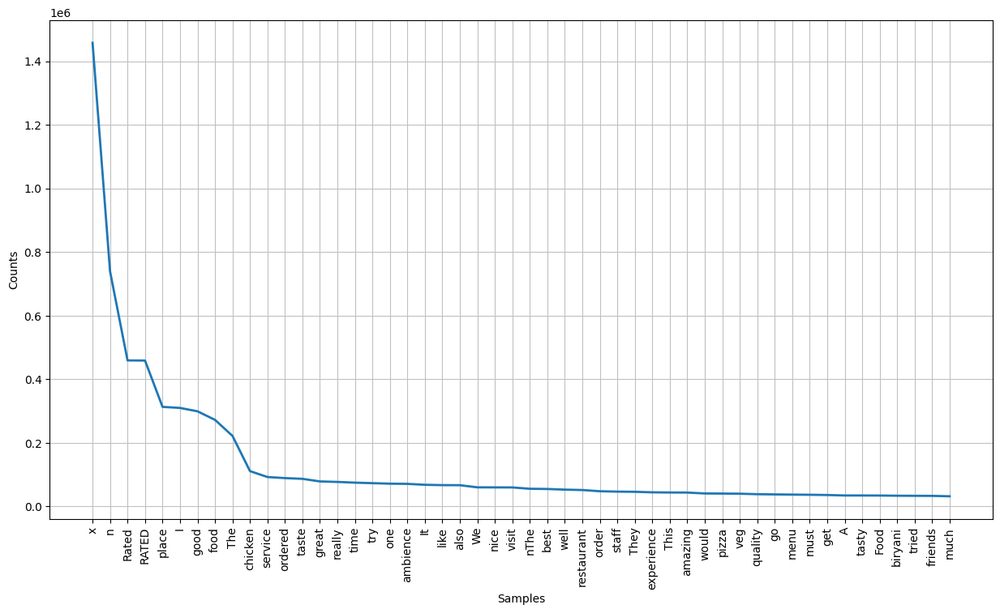

<Axes: xlabel='Samples', ylabel='Counts'>

In [59]:
plt.figure(figsize=(15,8))
fq.plot(50)

In [60]:
from nltk import bigrams

In [61]:
bigrams=bigrams(cleaned_reviews)

In [62]:
fd_bigrams=FreqDist()

In [63]:
for bigram in bigrams:
  fd_bigrams[bigram]=fd_bigrams[bigram]+1

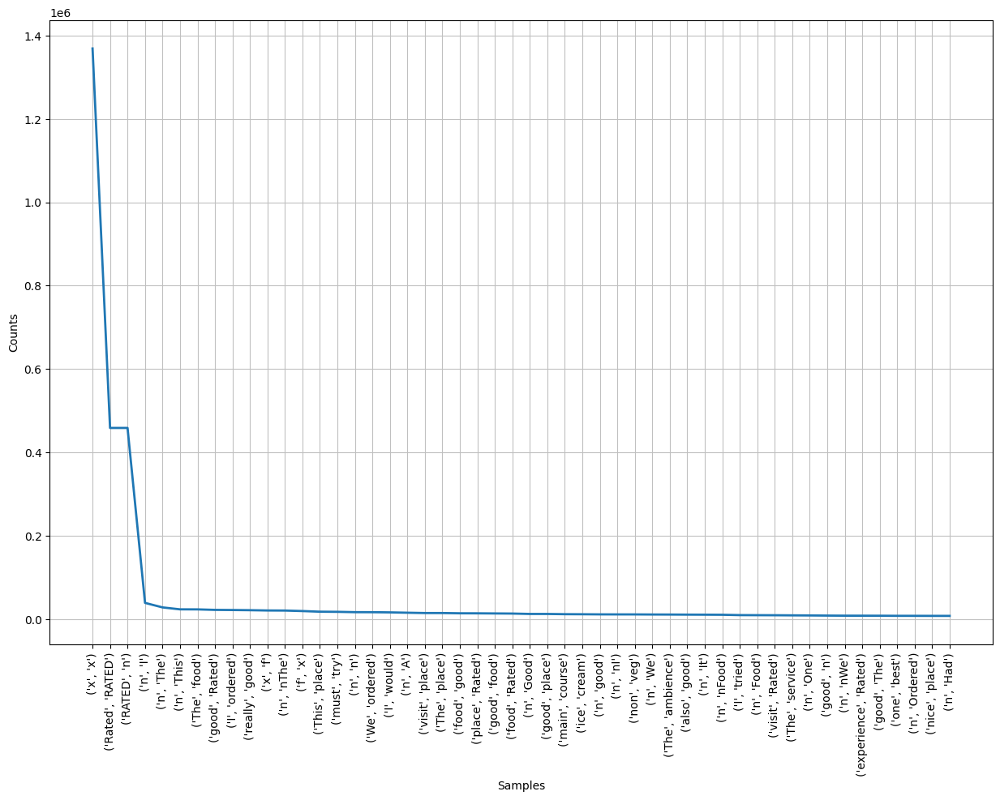

<Axes: xlabel='Samples', ylabel='Counts'>

In [64]:
plt.figure(figsize=(15,10))
fd_bigrams.plot(50)

In [65]:
from nltk import trigrams

In [66]:
trigrams=trigrams(cleaned_reviews)

In [67]:
fd_trigrams=FreqDist()

In [68]:
for trigram in trigrams:
  fd_trigrams[trigram]=fd_trigrams[trigram]+1

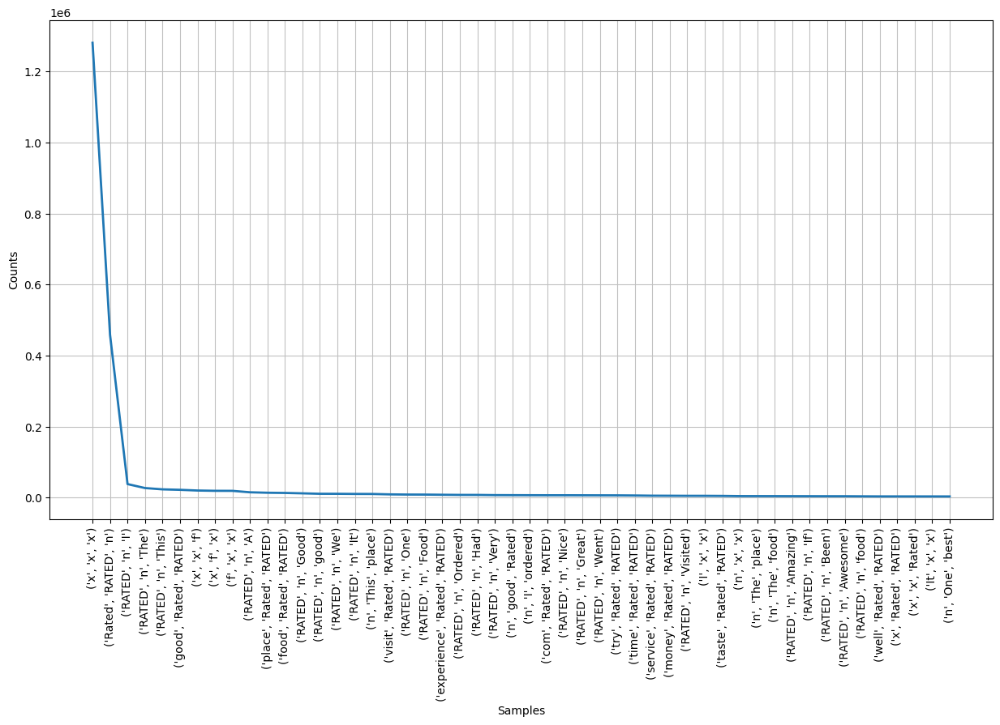

<Axes: xlabel='Samples', ylabel='Counts'>

In [69]:
 plt.figure(figsize=(15,8))
 fd_trigrams.plot(50)

In [70]:
cuisines=newdata[['cuisines','rating']]

In [71]:
cuisines.head()

,cuisines,rating
0,Fast Food,1
1,"Fast Food, Beverages",1
2,"Fast Food, Beverages",1
3,"Continental, Chinese, Italian",NaN
4,"Continental, Chinese, Italian",NaN


In [72]:
# data_cleaning
cuisines['cuisines'].dropna(inplace=True)

<ipython-input-72-0022eb705c35>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cuisines['cuisines'].dropna(inplace=True)


In [73]:
cuisines.isnull().sum()

cuisines      23
rating      4524
dtype: int64

In [74]:
cuisines.dropna(inplace=True)

<ipython-input-74-f59d4fb67a02>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cuisines.dropna(inplace=True)


In [75]:
cuisines.isnull().sum()

cuisines    0
rating      0
dtype: int64

In [76]:
cuisines['cuisines']=cuisines['cuisines'].apply(lambda x:x.lower())

<ipython-input-76-c1f7c8756ac9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cuisines['cuisines']=cuisines['cuisines'].apply(lambda x:x.lower())


In [77]:
cuisines_tokens=cuisines['cuisines'].apply(tokenizer.tokenize)

In [78]:
all_cuisines=cuisines_tokens.astype(str).str.cat()

In [79]:
cleaned_cuisines=tokenizer.tokenize(all_cuisines)

In [80]:
fd_cuisines=FreqDist()

In [81]:
for cuisine in cleaned_cuisines:
  fd_cuisines[cuisine]=fd_cuisines[cuisine]+1

In [82]:
fd_cuisines.most_common(10)

[('indian', 9622),
 ('north', 6941),
 ('chinese', 5143),
 ('food', 4239),
 ('south', 2650),
 ('fast', 2603),
 ('biryani', 2104),
 ('continental', 1942),
 ('desserts', 1857),
 ('cafe', 1809)]

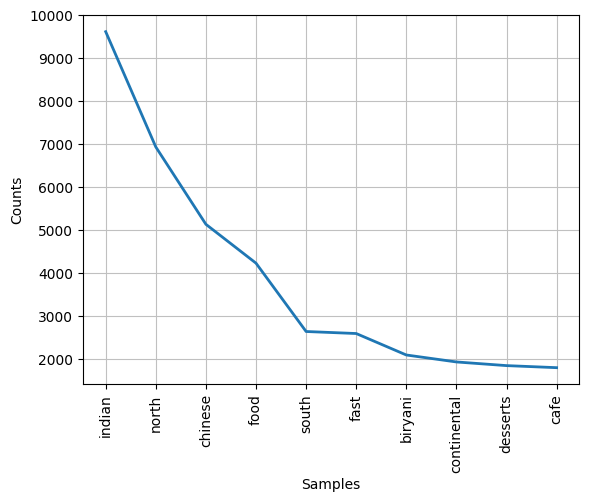

<Axes: xlabel='Samples', ylabel='Counts'>

In [83]:
fd_cuisines.plot(10)

In [84]:
newdata[['dish_liked','cuisines','reviews_list','menu_item']]=newdata[['dish_liked','cuisines','reviews_list','menu_item']].astype(str)

In [85]:
newdata['text']=newdata['review_list']+ ' ' + newdata['menu_item'] + ' ' + newdata['dish_liked'] + ' ' + newdata['cuisines']

In [86]:
newdata.head()

,name,address,listed_in(type)_x,url,online_order,book_table,rate,votes,phone,location,...,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type)_y,listed_in(city),rating,review_list,text
0,#FeelTheROLL,"Opposite Mantri Commercio, Outer Ring Road, De...","[Delivery, Delivery]",https://www.zomato.com/bangalore/feeltheroll-b...,No,No,3.4/5,7,+91 9108342079\r\n+91 9886117901,Bellandur,...,nan,Fast Food,200,"[('Rated 5.0', ""RATED\n Had an egg chicken ro...",[],Delivery,Bellandur,1,"[('rated 5.0', ""rated\n had an egg chicken ro...","[('rated 5.0', ""rated\n had an egg chicken ro..."
1,#L-81 Cafe,"Sector 6, HSR Layout, HSR","[Delivery, Dine-out, Delivery, Dine-out, Deliv...",https://www.zomato.com/bangalore/l-81-cafe-hsr...,Yes,No,3.9/5,48,+91 9986210891,HSR,...,Burgers,"Fast Food, Beverages",400,"[('Rated 4.0', 'RATED\n This little cafe is s...",[],Delivery,BTM,1,"[('rated 4.0', 'rated\n this little cafe is s...","[('rated 4.0', 'rated\n this little cafe is s..."
2,#L-81 Cafe,"Sector 6, HSR Layout, HSR","[Delivery, Dine-out, Delivery, Dine-out, Deliv...",https://www.zomato.com/bangalore/l-81-cafe-hsr...,Yes,No,3.9/5,48,+91 9986210891,HSR,...,Burgers,"Fast Food, Beverages",400,"[('Rated 4.0', 'RATED\n This little cafe is s...",[],Dine-out,BTM,1,"[('rated 4.0', 'rated\n this little cafe is s...","[('rated 4.0', 'rated\n this little cafe is s..."
3,#Vibes Restro,"Marasur Gate, Chandapura - Anekal Road, Near A...","[Buffet, Delivery, Dine-out]",https://www.zomato.com/bangalore/vibes-restro-...,No,No,NaN,0,+91 9538911285,Electronic City,...,nan,"Continental, Chinese, Italian",700,"[('Rated 5.0', ""RATED\n Great service and don...",[],Buffet,Electronic City,NaN,"[('rated 5.0', ""rated\n great service and don...","[('rated 5.0', ""rated\n great service and don..."
4,#Vibes Restro,"Marasur Gate, Chandapura - Anekal Road, Near A...","[Buffet, Delivery, Dine-out]",https://www.zomato.com/bangalore/vibes-restro-...,No,No,NaN,0,+91 9538911285,Electronic City,...,nan,"Continental, Chinese, Italian",700,"[('Rated 5.0', ""RATED\n Great service and don...",[],Delivery,Electronic City,NaN,"[('rated 5.0', ""rated\n great service and don...","[('rated 5.0', ""rated\n great service and don..."


In [87]:
text_data=newdata[['text','rating']]

In [88]:
text_data.head()

,text,rating
0,"[('rated 5.0', ""rated\n had an egg chicken ro...",1
1,"[('rated 4.0', 'rated\n this little cafe is s...",1
2,"[('rated 4.0', 'rated\n this little cafe is s...",1
3,"[('rated 5.0', ""rated\n great service and don...",NaN
4,"[('rated 5.0', ""rated\n great service and don...",NaN


In [89]:
text_data['text'][0]

'[(\'rated 5.0\', "rated\\n  had an egg chicken roll and a paneer roll... really yummy... a must visit place... it would be good if you guys can keep the shop open on sunday\'s as well.. good luck... :-)"), (\'rated 5.0\', \'rated\\n  not just the roll but the filling tastes great. i would highly recommend to others to try their rolls. owners hospitality is also good and very friendly.\'), (\'rated 4.5\', \'rated\\n  very nice place complete value for money ? highly recommend.must visit for any foodie . i would recommend the egg chicken roll . #feeltheroll\'), (\'rated 5.0\', \'rated\\n  had an amazing mouth-watering ?chicken roll?worth every bite..a must try for every foodie?a variety of rolls and sandwiches are available as well .. a budding rafflesia ?\')] [] nan Fast Food'

In [90]:
import warnings
from warnings import filterwarnings
filterwarnings('ignore')

In [91]:
text_data['text']=text_data['text'].apply(lambda x:x.lower())

In [92]:
df=text_data.sample(n=2000)

In [93]:
df.head()

,text,rating
16711,"[('rated 3.0', 'rated\n biryani was good but ...",1
14085,"[('rated 4.0', ""rated\n when i first stepped ...",1
2760,"[] [] nan desserts, ice cream",NaN
11990,"[('rated 4.0', 'rated\n i have been going to ...",1
9258,[] [] nan bakery,NaN


In [94]:
df.reset_index(inplace=True)

In [95]:
df.head()

,index,text,rating
0,16711,"[('rated 3.0', 'rated\n biryani was good but ...",1
1,14085,"[('rated 4.0', ""rated\n when i first stepped ...",1
2,2760,"[] [] nan desserts, ice cream",NaN
3,11990,"[('rated 4.0', 'rated\n i have been going to ...",1
4,9258,[] [] nan bakery,NaN


In [96]:
df.drop('index',axis=1,inplace=True)

In [97]:
df.head()

,text,rating
0,"[('rated 3.0', 'rated\n biryani was good but ...",1
1,"[('rated 4.0', ""rated\n when i first stepped ...",1
2,"[] [] nan desserts, ice cream",NaN
3,"[('rated 4.0', 'rated\n i have been going to ...",1
4,[] [] nan bakery,NaN


In [98]:
df.isnull().sum()

text        0
rating    431
dtype: int64

In [99]:
df.dropna(inplace=True)

In [100]:
df.isnull().sum()

text      0
rating    0
dtype: int64

In [101]:
tokens=df['text'].apply(tokenizer.tokenize)

In [102]:
tokens.apply(lambda x:[token for token in x if token not in stop])

0       [rated, rated, n, biryani, good, alot, improve...
1       [rated, rated, n, first, stepped, dead, heat, ...
3       [rated, rated, n, going, place, past, years, q...
5       [rated, rated, n, much, disappointed, ordered,...
6       [rated, rated, n, one, fucked, place, worst, f...
                              ...                        
1992    [rated, rated, n, tech, city, bangalore, find,...
1994    [rated, rated, n, ambenice, excellent, especia...
1995    [rated, rated, n, eating, food, stomach, got, ...
1998    [rated, rated, n, food, okayish, quantity, goo...
1999    [rated, rated, n, awesome, nice, place, visit,...
Name: text, Length: 1569, dtype: object

In [103]:
from nltk.stem import WordNetLemmatizer

In [104]:
wl=WordNetLemmatizer()
word=tokens[1]
word

['rated',
 'rated',
 'n',
 'when',
 'i',
 'first',
 'stepped',
 'in',
 'here',
 'and',
 'it',
 'was',
 'in',
 'the',
 'dead',
 'heat',
 'of',
 'summer',
 'i',
 'was',
 'skeptical',
 'there',
 'is',
 'a',
 'family',
 'room',
 'that',
 'is',
 'smoke',
 'free',
 'and',
 'with',
 'air',
 'conditioning',
 'that',
 'would',
 'instantly',
 'put',
 'you',
 'at',
 'ease',
 'i',
 'was',
 'won',
 'over',
 'though',
 'when',
 'we',
 'got',
 'a',
 'superbly',
 'chilled',
 'mug',
 'of',
 'their',
 'draught',
 'nice',
 'soo',
 'nice',
 'ni',
 'love',
 'the',
 'food',
 'we',
 'ordered',
 'and',
 'have',
 'always',
 'ordered',
 'the',
 'manglorean',
 'delicacies',
 'and',
 'there',
 'is',
 'nary',
 'a',
 'complaint',
 'the',
 'staff',
 'is',
 'attentive',
 'and',
 'if',
 'you',
 'can',
 'overlook',
 'the',
 'not',
 'so',
 'great',
 'ambience',
 'i',
 'can',
 'assure',
 'you',
 'the',
 'experience',
 'will',
 'be',
 'good',
 'btw',
 'i',
 'do',
 'choose',
 'to',
 'sit',
 'out',
 'where',
 'the',
 'windo

In [105]:
import nltk
nltk.download('wordnet')


[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [106]:
lem=[]
for wd in word:
  lem.append(wl.lemmatize(wd))
lem

['rated',
 'rated',
 'n',
 'when',
 'i',
 'first',
 'stepped',
 'in',
 'here',
 'and',
 'it',
 'wa',
 'in',
 'the',
 'dead',
 'heat',
 'of',
 'summer',
 'i',
 'wa',
 'skeptical',
 'there',
 'is',
 'a',
 'family',
 'room',
 'that',
 'is',
 'smoke',
 'free',
 'and',
 'with',
 'air',
 'conditioning',
 'that',
 'would',
 'instantly',
 'put',
 'you',
 'at',
 'ease',
 'i',
 'wa',
 'won',
 'over',
 'though',
 'when',
 'we',
 'got',
 'a',
 'superbly',
 'chilled',
 'mug',
 'of',
 'their',
 'draught',
 'nice',
 'soo',
 'nice',
 'ni',
 'love',
 'the',
 'food',
 'we',
 'ordered',
 'and',
 'have',
 'always',
 'ordered',
 'the',
 'manglorean',
 'delicacy',
 'and',
 'there',
 'is',
 'nary',
 'a',
 'complaint',
 'the',
 'staff',
 'is',
 'attentive',
 'and',
 'if',
 'you',
 'can',
 'overlook',
 'the',
 'not',
 'so',
 'great',
 'ambience',
 'i',
 'can',
 'assure',
 'you',
 'the',
 'experience',
 'will',
 'be',
 'good',
 'btw',
 'i',
 'do',
 'choose',
 'to',
 'sit',
 'out',
 'where',
 'the',
 'window',
 

In [107]:
def lem(text):
  return [wl.lemmatize(wd) for wd in text]

In [108]:
tokens_new=tokens.apply(lem)

In [109]:
from sklearn.preprocessing import LabelEncoder

In [112]:
le=LabelEncoder()

In [113]:
df['rating']=le.fit_transform(df['rating'])

In [115]:
corpus=[]
for i in tokens_new.index:
  review=' '.join(tokens_new[i])
  corpus.append(review)

In [116]:
corpus

['rated rated n biryani wa good but alot of improvement is required for chicken chaap it wa not at all the near about the original receipe it wa like chicken given in tomato chop masala gravy with some cashew paste chicken should have been fried more and gravy should have been cooked more rated rated n best place to have awesome bengali food at affordable price in and around whitefield nwhat i feel is they should estimate the demand a little better so that they are not short of food due to the crowd rated rated n our very go to place when we have craving for odia bengali authentic food this time we ordered a raja rani thali it wa huge too much for two people to finish it s a complete package of all authentic non veg fish prawn mutton chicken and egg curry in a plate felt so home made the best wa aloo posto food wa delicious lip smacking and finger licking must say nambience is nice and cosy nwaiters are polite and very responsive a very well managed place rated rated n being a bengali 

In [119]:
!pip install sklearn

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [121]:
# using TF_id
import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer

In [123]:
cv=TfidfVectorizer()

In [124]:
X=cv.fit_transform(corpus).toarray()

In [125]:
from sklearn.model_selection import train_test_split


In [126]:
X_train,X_test,y_train,y_test=train_test_split(X,df['rating'],test_size=0.3,random_state=0,stratify=df['rating'])

In [127]:
from sklearn.linear_model import LogisticRegression

In [128]:
lr=LogisticRegression(multi_class='multinomial')

In [129]:
lr.fit(X_train,y_train)

LogisticRegression(multi_class='multinomial')

In [130]:
predictions=lr.predict(X_test)

In [131]:
from sklearn.metrics import confusion_matrix,accuracy_score

In [133]:
confusion_matrix(predictions,y_test)

array([[  5,   3,   0],
       [ 86, 313,  30],
       [  0,   4,  30]])

In [135]:
accuracy_score(predictions,y_test)

0.7388535031847133

In [138]:
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

In [141]:
models=[]

models.append(('logistic Regression',LogisticRegression()))
models.append(('navie bayes',GaussianNB()))
models.append(('random forest',RandomForestClassifier()))
models.append(('Decision Tree',DecisionTreeClassifier()))
models.append(('KNN',KNeighborsClassifier()))

In [144]:
for name,model in models:
  print(name)
  model.fit(X_train,y_train)
  predictions2=model.predict(X_test)

  print(confusion_matrix(predictions2,y_test))
  print(accuracy_score(predictions2,y_test))

logistic Regression
[[  5   3   0]
 [ 86 313  30]
 [  0   4  30]]
0.7388535031847133
navie bayes
[[ 18  31   0]
 [ 64 223  27]
 [  9  66  33]]
0.5817409766454352
random forest
[[  6   3   0]
 [ 85 313  35]
 [  0   4  25]]
0.7303609341825902
Decision Tree
[[ 29  46   3]
 [ 58 241  26]
 [  4  33  31]]
0.6390658174097664
KNN
[[ 25  41   2]
 [ 47 190  11]
 [ 19  89  47]]
0.5562632696390658


In [145]:
from sklearn.model_selection import cross_val_score

In [146]:
print(cross_val_score(lr,X,df['rating'],cv=5,scoring='accuracy').mean())

0.7246657577175881
